In [1]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import time

In [2]:
VIDEOS_PATH = "/content/dataset/raw_videos"
IMAGES_PATH = "/content/dataset/images"
IMAGE_DIMS = (320, 240)
FRAME_SKIP = 1

In [3]:
# Dataset is divided into dictionaries of classes
# Each class contains contains a list of dictionaries
# Each dictionary carries the google drive URL and the time interval of interset represented as [Start time, End time] in seconds
# None for end time means until the end 

dataset = {
    "gate":[
            {"id":"1kcokhzXWutRcUPBuckCQfk6KSna4VoH1", "time":[3, 5]},
            {"id":"1yXhZQ5SoXdCJbbP3Ynk8C7niCj64i3Yv", "time":[0, 2]},
            {"id":"1068GQ6TbXUbnnYdhEp93wEGV-gZND5Si", "time":[0, 10]},
            {"id":"1cyaXGP8Y3ew_kWOAWqY1wqvnSL7LcV-V", "time":[0, 6]},
            {"id":"18G8lNKye2jF4XA9Wp3ayulAWp9t42Lg-", "time":[0, 4]},
            {"id":"1IPJXXQGx1qaLWm21DiQ0Ykf95GeKgLEK", "time":[2, 15]},
            {"id":"11i-PGRHadcdM_I_Ac4eY5s1squMjwcSW", "time":[0, 17]},
            {"id":"1Pxg3wq_NI6kixxmiGrN3i8zYY6lSZtCT", "time":[11, 22]},
            {"id":"1DFxOBErILaqwLnUWnp_LAA0w6nrCestE", "time":[2, 12]},
            {"id":"1tkY7PNNUdDmEJEMwtBo1AEGre2ej7-eq", "time":[2, 16]},
            {"id":"1EC5jTVkmp8F38CekmKGOI5cozlIanap2", "time":[0, 12]},
            {"id":"1ZgB6H3BvIpY2hGlxRZyNWqxNzqXEcaOd", "time":[0, 17]},
            {"id":"1npIbYXxzQ4248YWSHbiZeHTiVGtj2-qG", "time":[4, 12]},
            {"id":"13BU46vHAALG3vchYreWsftnibYi22jyX", "time":[4, 22]}
            ],
    "non_gate":[
                {"id":"1JIA40xvLcr9e2fibnvkQrBSIvqhwF7tF", "time":[0, None]},
                {"id":"1oTNF3aS3Z_UbB6DDlwWButbILlARovl9", "time":[0, None]},
                {"id":"1TZ_LyrvK-XSCxFWFrdD24Wz4votx6-30", "time":[0, None]},
                {"id":"14A_cWDJN8YWrT3tpCHiLrQpNkklIFiuG", "time":[0, None]},
                {"id":"1npIbYXxzQ4248YWSHbiZeHTiVGtj2-qG", "time":[21, None]},
                {"id":"13BU46vHAALG3vchYreWsftnibYi22jyX", "time":[61, None]}
                ]
}

In [4]:
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [5]:
# Create dataset directories
os.makedirs(VIDEOS_PATH, exist_ok=True)
os.makedirs(IMAGES_PATH, exist_ok=True)

# Download files and save frames

# Loop over classes
for current_class, videos in dataset.items():
  print("Processing {} class.".format(current_class))
  img_idx = 0
  # Create a directory for the class in videos and images path
  os.makedirs(os.path.join(VIDEOS_PATH, current_class), exist_ok=True)
  os.makedirs(os.path.join(IMAGES_PATH, current_class), exist_ok=True)
  os.chdir(os.path.join(VIDEOS_PATH, current_class))
  # Loop over videos in each class
  for index, video in enumerate(videos):
    # Download the video
    downloaded = drive.CreateFile({'id':video["id"]})
    video_name = str(index) + ".mp4"
    print("Processing {}".format(video_name))
    downloaded.GetContentFile(video_name)
    # Open the video
    cap = cv2.VideoCapture(video_name)
    # Get the frame rate
    fps = cap.get(cv2.CAP_PROP_FPS)
    # Get start frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, round(fps * video["time"][0]))
    # Get end frame
    if video["time"][1] == None:
      end_frame = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    else:
      end_frame = round(fps * video["time"][1])

    frame_idx = 0

    while cap.isOpened() and cap.get(cv2.CAP_PROP_POS_FRAMES) < end_frame:
      # Read frame
      ret, frame = cap.read()
      if not ret:
        break

      if frame_idx % FRAME_SKIP == 0:
        # Save image
        cv2.imwrite(os.path.join(IMAGES_PATH, current_class, str(img_idx) + ".jpg"), frame)
        img_idx += 1

      frame_idx += 1

    cap.release()

  os.chdir("/content")

Processing gate class.
Processing 0.mp4
Processing 1.mp4
Processing 2.mp4
Processing 3.mp4
Processing 4.mp4
Processing 5.mp4
Processing 6.mp4
Processing 7.mp4
Processing 8.mp4
Processing 9.mp4
Processing 10.mp4
Processing 11.mp4
Processing 12.mp4
Processing 13.mp4
Processing non_gate class.
Processing 0.mp4
Processing 1.mp4
Processing 2.mp4
Processing 3.mp4
Processing 4.mp4
Processing 5.mp4


In [6]:
# Number of images of each class
dataset_size = 0
for current_class, _ in dataset.items():
  num_imgs = len(os.listdir(os.path.join(IMAGES_PATH, current_class)))
  dataset_size += num_imgs
  print("{} {} class images.".format(num_imgs,current_class))
print("Total dataset size = {}".format(dataset_size))

2106 gate class images.
3288 non_gate class images.
Total dataset size = 5394


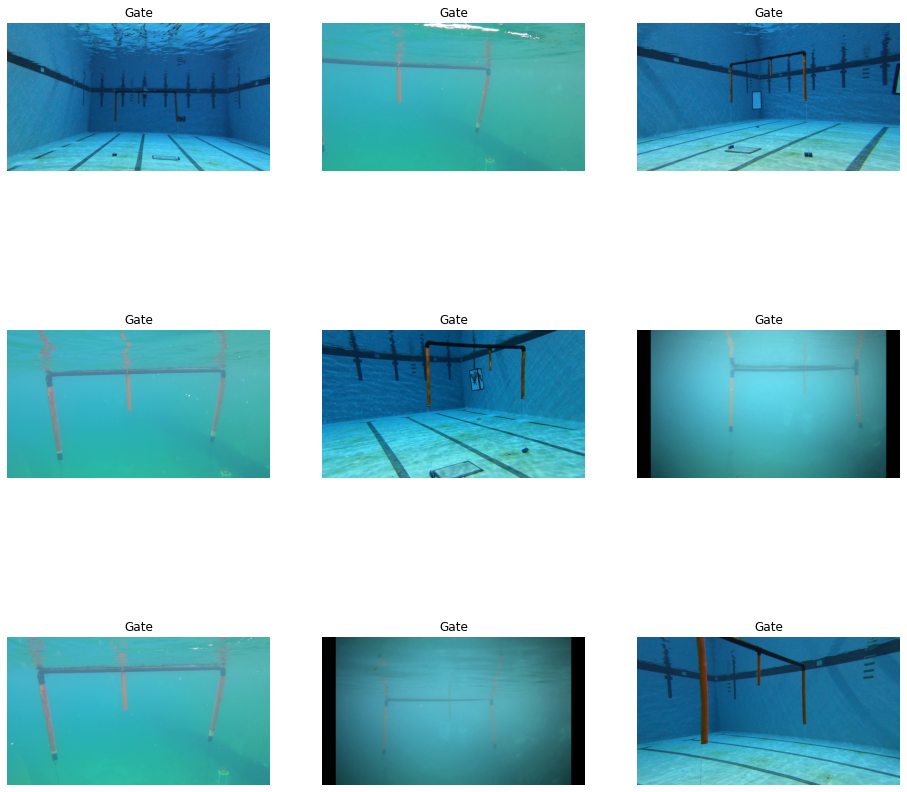

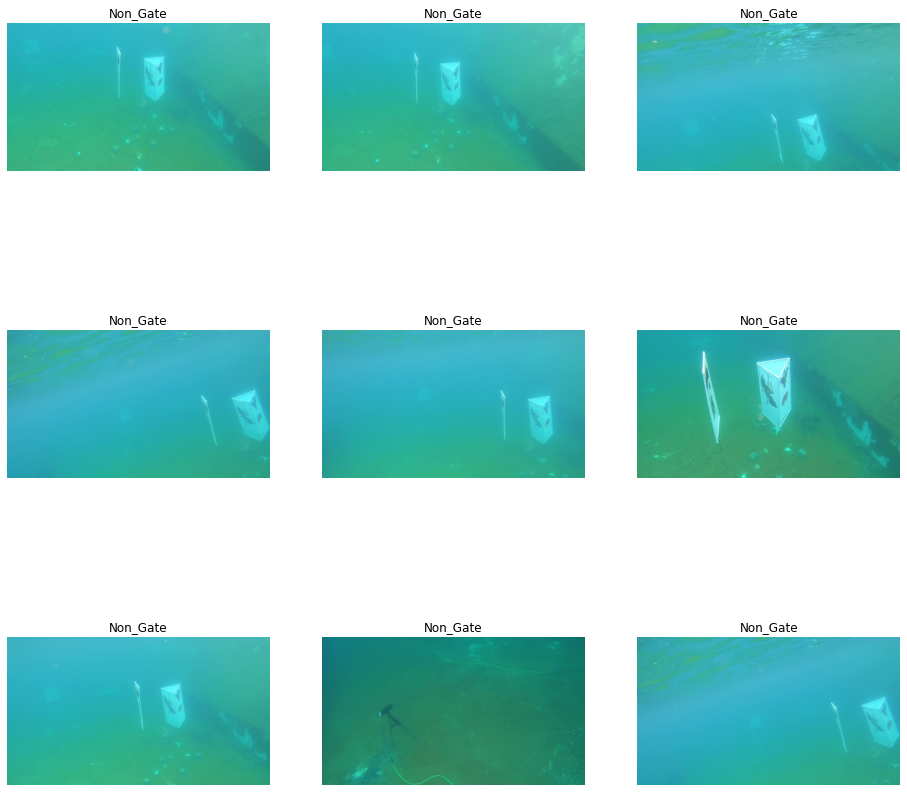

In [7]:
# Sample images from each class
n_columns = 3
n_rows = 3
for current_class, _ in dataset.items():  
  num_imgs = len(os.listdir(os.path.join(IMAGES_PATH, current_class)))
  fig = plt.figure(figsize=(16, 16))
  rnd_idx = np.random.randint(0, num_imgs - 1, n_columns * n_rows)
  for i in range(n_columns * n_rows):
    img = plt.imread(os.path.join(IMAGES_PATH, current_class, str(rnd_idx[i]) + ".jpg"))
    fig.add_subplot(n_rows, n_columns, i + 1)
    plt.imshow(img)
    plt.title(current_class.title())
    plt.axis('off')

In [8]:
import tensorflow as tf
from tensorflow import keras

In [9]:
num_classes = len(dataset.keys())
BATCH_SIZE = 32
EPOCHS = 10

In [10]:
tf_dataset = keras.preprocessing.image_dataset_from_directory(
    directory=IMAGES_PATH,
    labels="inferred",
    label_mode="binary" if (num_classes == 2) else 'categorical',
    class_names=dataset.keys(),
    color_mode="rgb",
    image_size=IMAGE_DIMS[::-1],
    shuffle=True,
    batch_size=BATCH_SIZE
)

Found 5394 files belonging to 2 classes.


In [11]:
def preprocess(images, labels):
  """
  # Randomly flip the image horizontaly
  images = keras.layers.Lambda(
      lambda image: tf.image.random_flip_left_right(image))(images)
  # Randomly adjust the saturation
  images = keras.layers.Lambda(
      lambda image: tf.image.random_saturation(image, 0, 10))(images)
  # Randomly adjust the brightness
  images = keras.layers.Lambda(
      lambda image: tf.image.random_brightness(image, 20))(images)
  """
  # Normalize images
  images = keras.layers.Lambda(lambda image: image/255.0)(images)
  return (images, labels)

In [12]:
# Preprocess the data
tf_dataset = tf_dataset.map(preprocess).prefetch(1)

In [13]:
# Split the dataset into training and validation sets
train_dataset_size = int(0.8 * dataset_size / BATCH_SIZE)
valid_dataset_size = int(0.2 * dataset_size / BATCH_SIZE)

train_dataset = tf_dataset.take(train_dataset_size)
valid_dataset = tf_dataset.skip(train_dataset_size)

In [14]:
class AUVClassificationModel(keras.models.Model):
  def __init__(self, num_classes, **kwargs):
    super().__init__(**kwargs)
    self.num_classes = num_classes

    # Convolutional layers
    self.conv_1 = keras.layers.Conv2D(filters=16,
                                      kernel_size=(3, 3),
                                      strides=(1, 1),
                                      padding="valid")
    
    self.conv_2 = keras.layers.Conv2D(filters=32,
                                      kernel_size=(3, 3),
                                      strides=(1, 1),
                                      padding="valid")
    
    self.conv_3 = keras.layers.Conv2D(filters=32,
                                      kernel_size=(3, 3),
                                      strides=(1, 1),
                                      padding="valid")
    
    self.conv_4 = keras.layers.Conv2D(filters=64,
                                      kernel_size=(3, 3),
                                      strides=(1, 1),
                                      padding="valid")
    
    # Pooling layers
    self.pool_1 = keras.layers.MaxPool2D(pool_size=(2, 2),
                                         strides=(2, 2),
                                         padding='valid')
    
    self.pool_2 = keras.layers.MaxPool2D(pool_size=(2, 2),
                                         strides=(2, 2),
                                         padding='valid')
    
    self.pool_3 = keras.layers.MaxPool2D(pool_size=(2, 2),
                                         strides=(2, 2),
                                         padding='valid')
    
    self.pool_4 = keras.layers.MaxPool2D(pool_size=(2, 2),
                                         strides=(2, 2),
                                         padding='valid')
    
    # Batch Normalization layers.
    self.batch_norm_1 = keras.layers.BatchNormalization()
    self.batch_norm_2 = keras.layers.BatchNormalization()
    self.batch_norm_3 = keras.layers.BatchNormalization()
    self.batch_norm_4 = keras.layers.BatchNormalization()

    # Activation layers
    self.activation_1 = keras.layers.Activation('relu')
    self.activation_2 = keras.layers.Activation('relu')
    self.activation_3 = keras.layers.Activation('relu')
    self.activation_4 = keras.layers.Activation('relu')

    # Flatten layer
    self.flatten_1 = keras.layers.Flatten()

    # Dense layers.
    self.dense_1 = keras.layers.Dense(units=128,
                                      activation='relu')
    
    self.dense_2 = keras.layers.Dense(units=32,
                                      activation='relu')
    
    self.dense_3 = keras.layers.Dense(units=1 if self.num_classes == 2 else self.num_classes,
                    activation="sigmoid" if self.num_classes == 2 else "softmax")
    

  def call(self, inputs):
    # First Layer
    inputs = self.conv_1(inputs)
    inputs = self.batch_norm_1(inputs)
    inputs = self.activation_1(inputs)
    inputs = self.pool_1(inputs)

    # Second Layer
    inputs = self.conv_2(inputs)
    inputs = self.batch_norm_2(inputs)
    inputs = self.activation_2(inputs)
    inputs = self.pool_2(inputs)

    # Third Layer
    inputs = self.conv_3(inputs)
    inputs = self.batch_norm_3(inputs)
    inputs = self.activation_3(inputs)
    inputs = self.pool_3(inputs)

    # Fourth Layer
    inputs = self.conv_4(inputs)
    inputs = self.batch_norm_4(inputs)
    inputs = self.activation_4(inputs)
    inputs = self.pool_4(inputs)

    inputs = self.flatten_1(inputs)

    # Fifth layer
    inputs = self.dense_1(inputs)

    # Sixth layer
    inputs = self.dense_2(inputs)

    # Output layer
    inputs = self.dense_3(inputs)

    return inputs
  


In [15]:
# Create the model
model = AUVClassificationModel(num_classes)

In [16]:
# Compile the model
model.compile(optimizer="adam",
              loss="binary_crossentropy" if num_classes == 2 else "categorical_crossentropy",
              metrics=["binary_accuracy" if num_classes == 2 else "categorical_accuracy"])

In [17]:
def exponential_decay(lr0, s):
  def exponential_decay_fn(epoch):
    return lr0 * 0.1**(epoch / s)
  return exponential_decay_fn

exponential_decay_fn = exponential_decay(lr0=0.01, s=10)

In [18]:
root_logdir = os.path.join(os.curdir, "my_logs")

def get_run_logdir():
  run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
  return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

In [19]:
# Fit the model
callbacks = [keras.callbacks.EarlyStopping(min_delta=0.01, patience=2),
             keras.callbacks.ModelCheckpoint("model_checkpoint",
                                             save_best_only=True),
             keras.callbacks.TensorBoard(run_logdir),
             keras.callbacks.LearningRateScheduler(exponential_decay_fn)]
             
history = model.fit(train_dataset,
                    validation_data=valid_dataset,
                    callbacks=callbacks,
                    epochs=EPOCHS)

Epoch 1/10
  1/134 [..............................] - ETA: 0s - loss: 0.7924 - binary_accuracy: 0.5000WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
134/134 [==============================] - 112s 833ms/step - loss: 1.2200 - binary_accuracy: 0.9258 - val_loss: 0.7341 - val_binary_accuracy: 0.8770
Epoch 2/10
134/134 [==============================] - 110s 823ms/step - loss: 0.1610 - binary_accuracy: 0.9932 - val_loss: 0.8044 - val_binary_accuracy: 0.8834
Epoch 3/10
134/134 [==============================] - 110s 823ms/step - loss: 0.1295 - binary_accuracy: 0.9928 - val_loss: 0.5566 - val_binary_accuracy: 0.9277
Epoch 4/10
134/134 [==============================] - 110s 822ms/step - loss: 0.0126 - binary_accuracy: 0.9970 - val_loss: 0.0053 - val_binary_accuracy

In [20]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

<IPython.core.display.Javascript object>

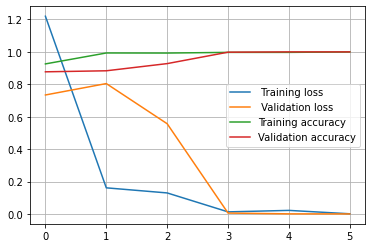

In [21]:
plt.plot(history.history["loss"], label=" Training loss")
plt.plot(history.history["val_loss"], label=" Validation loss")
plt.plot(history.history["binary_accuracy"], label="Training accuracy")
plt.plot(history.history["val_binary_accuracy"], label="Validation accuracy")
plt.legend()
plt.grid()

In [22]:
# Load the best model
model.load_weights("model_checkpoint")

In [23]:
model.summary()

Model: "auv_classification_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  448       
_________________________________________________________________
conv2d_1 (Conv2D)            multiple                  4640      
_________________________________________________________________
conv2d_2 (Conv2D)            multiple                  9248      
_________________________________________________________________
conv2d_3 (Conv2D)            multiple                  18496     
_________________________________________________________________
max_pooling2d (MaxPooling2D) multiple                  0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 multiple                  0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 multiple     

In [24]:
model.save("saved_model")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: saved_model/assets


In [25]:
!zip -r GateDetection_NeuralNetwork.zip saved_model

  adding: saved_model/ (stored 0%)
  adding: saved_model/assets/ (stored 0%)
  adding: saved_model/variables/ (stored 0%)
  adding: saved_model/variables/variables.index (deflated 72%)
  adding: saved_model/variables/variables.data-00000-of-00001 (deflated 24%)
  adding: saved_model/saved_model.pb (deflated 91%)


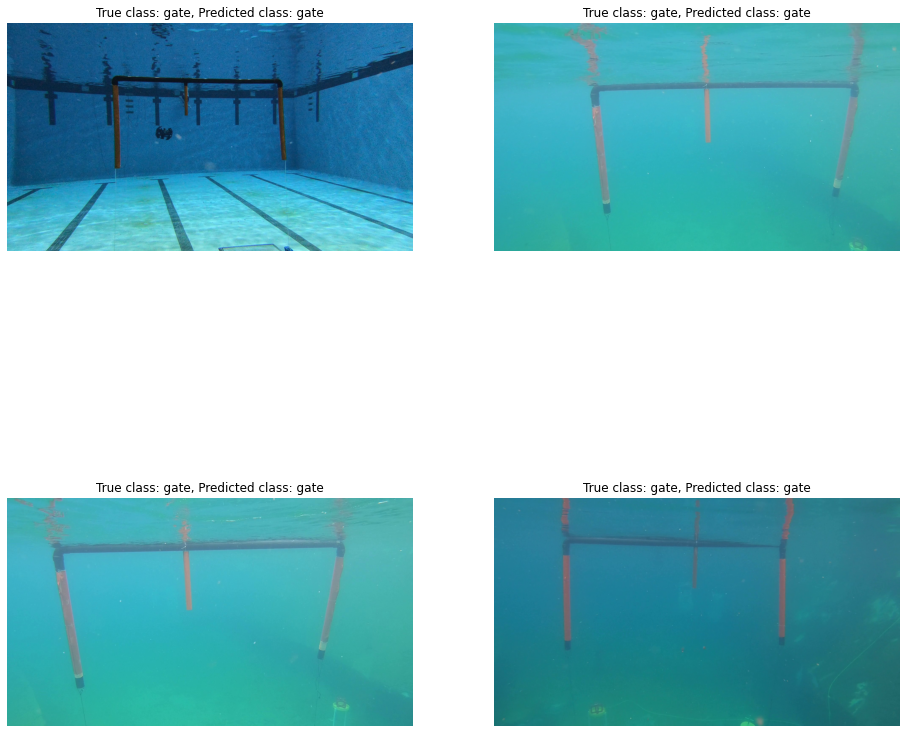

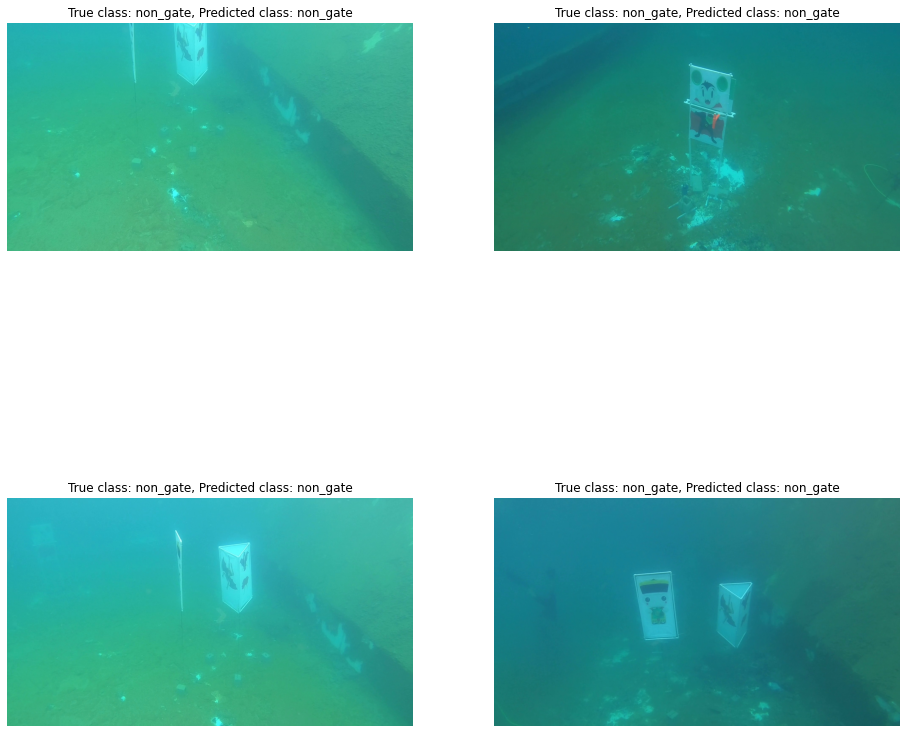

In [32]:
# Sample images from each class
n_columns = 2
n_rows = 2
for current_class, _ in dataset.items():  
  num_imgs = len(os.listdir(os.path.join(IMAGES_PATH, current_class)))
  fig = plt.figure(figsize=(16, 16))
  rnd_idx = np.random.randint(0, num_imgs - 1, n_columns * n_rows)
  for i in range(n_columns * n_rows):
    img = plt.imread(os.path.join(IMAGES_PATH, current_class, str(rnd_idx[i]) + ".jpg"))
    fig.add_subplot(n_rows, n_columns, i + 1)
    plt.imshow(img)
    # Resize the image
    img = cv2.resize(img, IMAGE_DIMS, interpolation =cv2.INTER_AREA)
    # Add a dimension
    img = np.expand_dims(img, axis=0)
    # Normalize the image
    img = img.astype(np.float32) / 255.0
    prediction = model.predict(img)
    prediction = np.where(prediction < 0.5, 0, 1)
    plt.title("True class: {}, Predicted class: {}".format(current_class, list(dataset.keys())[prediction[0][0]]))
    plt.axis('off')